# Projet DATA732
## Text Clustering by Latent Dirichlet Allocation with CountVectorizer
Clusters of the articles description by the contents

## 0) Pre config

In [1]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import numpy as np
import string

from nltk.corpus import stopwords

from IPython.display import display
from collections import Counter

import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

from bokeh.plotting import figure, show
from bokeh.models import Label
from bokeh.io import output_notebook
from bokeh.models import Label
output_notebook()

%matplotlib inline

Loading BokehJS ...

## 1) Data
Data extraction from pre-generated df 

In [3]:
#df = pd.read_json('./new_df/df_kws_article.json', orient='records')
df = pd.read_json('./new_df/df_multiple_articles.json', orient='records')

In [4]:
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

In [5]:
numberArticles = df.shape[0]
print(f'Number of articles: {numberArticles}')

Number of articles: 36600


In [6]:
none_count = df['description'].isna().sum()
print(f"number None type in description: {none_count}")
print(f'Porcentage of None value in total: {100*none_count/df.shape[0]:.2f} %')

df = df.dropna(subset=['description'])

number None type in description: 115
Porcentage of None value in total: 0.31 %


### 1.1) Text Cleaning 

In [7]:
df['CleanedData']=df['content'].str.lower()
df['CleanedData'] = df['CleanedData'].str.replace('[{}]'.format(string.punctuation), '', regex=True)
df.head(5)

,year,month,day,url,title,description,content,lang,kws,locations,miscellaneus,organizations,persons,domain,date,CleanedData
0,2019,1,1,https://fr.sputniknews.africa/20190102/macron-...,Macron reconnaît avoir répondu aux messages de...,L'Élysée a confirmé ce mercredi que le Préside...,"Lundi, quelques heures après qu'Alexandre Bena...",fr,"{'benalla': 12, 'macron': 11, 'message': 7, 'я...","{'État': 2, 'France': 3}",{},"{'Mediapart': 2, 'Canard': 2}","{'Alexandre Benalla': 3, 'Emmanuel Macron': 5,...",fr.sputniknews.africa,2019-01-01,lundi quelques heures après qualexandre benall...
1,2019,1,1,https://fr.sputniknews.africa/20190102/saint-s...,Ce que l’on sait des attaques contre des passa...,Un homme a foncé avec sa voiture dans la nuit ...,Un conducteur qui aurait été motivé par des se...,fr,"{'police': 5, 'attaque': 5, 'étranger': 4, 'co...","{'Syrie': 2, 'Afghanistan': 2, 'Bottrop': 2, '...",{},{'ministre de l'Intérieur': 2},{},fr.sputniknews.africa,2019-01-01,un conducteur qui aurait été motivé par des se...
2,2019,1,1,https://fr.sputniknews.africa/20190102/tags-ra...,Des tags racistes appelant à «tuer les arabes»...,Dans un paisible village français de 4.200 âme...,"Comme l’écrit Nice Matin, Kill arabs sur un mu...",fr,"{'mur': 3, 'nuit': 2, 'véhicule': 2, 'village'...",{'Saint-Jeannet': 2},{},{},{},fr.sputniknews.africa,2019-01-01,comme l’écrit nice matin kill arabs sur un mur...
3,2019,1,1,https://fr.sputniknews.africa/20190102/union-e...,Et le pays européen où l’on dépense le plus d’...,"Parmi tous les pays de l’Union européenne, l’E...",L'Office européen des statistiques Eurostat a ...,fr,"{'pays': 5, 'européen': 4, 'alcool': 4, 'boiss...","{'Lettonie': 2, 'Lituanie': 2}",{},{'Eurostat': 2},{},fr.sputniknews.africa,2019-01-01,loffice européen des statistiques eurostat a c...
4,2019,1,1,https://fr.sputniknews.africa/20190102/depot-p...,Le dépôt pétrolier près de Rouen bloqué par le...,Des dizaines de Gilets jaunes ont bloqué le 2 ...,"Le dépôt pétrolier de Rubis de Grand-Quevilly,...",fr,"{'dépôt': 7, 'gilet': 6, 'jaune': 6, 'pétrolie...",{'Rouen': 2},{'Gilets jaunes': 4},{},{},fr.sputniknews.africa,2019-01-01,le dépôt pétrolier de rubis de grandquevilly p...


## 2) Vectorization 

In [8]:
list_suplementaire_stopwords = [
    "a", "à", "â", "abord", "afin", "ah", "ai", "aie", "ainsi", "allaient", "allo", "allô",
    "allons", "après", "assez", "attendu", "au", "aucun", "aucune", "aujourd", "aujourd'hui",
    "auquel", "aura", "auront", "aussi", "autre", "autres", "aux", "auxquelles", "auxquels",
    "avaient", "avais", "avait", "avant", "avec", "avoir", "ayant", "b", "bah", "beaucoup",
    "bien", "bigre", "boum", "bravo", "brrr", "c", "ça", "car", "ce", "ceci", "cela",
    "celle", "celle-ci", "celle-là", "celles", "celles-ci", "celles-là", "celui", "celui-ci",
    "celui-là", "cent", "cependant", "certain", "certaine", "certaines", "certains", "certes",
    "ces", "cet", "cette", "ceux", "ceux-ci", "ceux-là", "chacun", "chaque", "cher", "chère",
    "chères", "chers", "chez", "chiche", "chut", "ci", "cinq", "cinquantaine", "cinquante",
    "cinquantième", "cinquième", "clac", "clic", "combien", "comme", "comment", "compris",
    "concernant", "contre", "couic", "crac", "d", "da", "dans", "de", "debout", "dedans",
    "dehors", "delà", "depuis", "derrière", "des", "dès", "désormais", "desquelles", "desquels",
    "dessous", "dessus", "deux", "deuxième", "deuxièmement", "devant", "devers", "devra",
    "différent", "différente", "différentes", "différents", "dire", "divers", "diverse", "diverses",
    "dix", "dix-huit", "dixième", "dix-neuf", "dix-sept", "doit", "doivent", "donc", "dont",
    "douze", "douzième", "dring", "du", "duquel", "durant", "e", "effet", "eh", "elle",
    "elle-même", "elles", "elles-mêmes", "en", "encore", "entre", "envers", "environ", "es",
    "ès", "est", "et", "etant", "étaient", "étais", "était", "étant", "etc", "été", "etre",
    "être", "eu", "euh", "eux", "eux-mêmes", "excepté", "f", "façon", "fais", "faisaient",
    "faisant", "fait", "feront", "fi", "flac", "floc", "font", "g", "gens", "h", "ha",
    "hé", "hein", "hélas", "hem", "hep", "hi", "ho", "holà", "hop", "hormis", "hors",
    "hou", "houp", "hue", "hui", "huit", "huitième", "hum", "hurrah", "i", "il", "ils",
    "importe", "j", "je", "jusqu", "jusque", "k", "l", "la", "là", "laquelle", "las",
    "le", "lequel", "les", "lès", "lesquelles", "lesquels", "leur", "leurs", "longtemps",
    "lorsque", "lui", "lui-même", "m", "ma", "maint", "mais", "malgré", "me", "même",
    "mêmes", "merci", "mes", "mien", "mienne", "miennes", "miens", "mille", "mince", "moi",
    "moi-même", "moins", "mon", "moyennant", "n", "na", "ne", "néanmoins", "neuf", "neuvième",
    "ni", "nombreuses", "nombreux", "non", "nos", "notre", "nôtre", "nôtres", "nous",
    "nous-mêmes", "nul", "o", "o|", "ô", "oh", "ohé", "olé", "ollé", "on", "ont", "onze",
    "onzième", "ore", "ou", "où", "ouf", "ouias", "oust", "ouste", "outre", "p", "paf", "pan",
    "par", "parmi", "partant", "particulier", "particulière", "particulièrement", "pas", "passé",
    "pendant", "personne", "peu", "peut", "peuvent", "peux", "pff", "pfft", "pfut", "pif",
    "plein", "plouf", "plus", "plusieurs", "plutôt", "pouah", "pour", "pourquoi", "premier",
    "première", "premièrement", "près", "proche", "psitt", "puisque", "q", "qu", "quand", "quant",
    "quanta", "quant-à-soi", "quarante", "quatorze", "quatre", "quatre-vingt", "quatrième",
    "quatrièmement", "que", "quel", "quelconque", "quelle", "quelles", "quelque", "quelques",
    "quelquun", "quels", "qui", "quiconque", "quinze", "quoi", "quoique", "r", "revoici", "revoilà",
    "rien", "s", "sa", "sacrebleu", "sans", "sapristi", "sauf", "se", "seize", "selon",
    "sept", "septième", "sera", "seront", "ses", "si", "sien", "sienne", "siennes", "siens",
    "sinon", "six", "sixième", "soi", "soi-même", "soit", "soixante", "son", "sont", "sous",
    "stop", "suis", "suivant", "sur", "surtout", "t", "ta", "tac", "tant", "te", "té",
    "tel", "telle", "tellement", "telles", "tels", "tenant", "tes", "tic", "tien", "tienne",
    "tiennes", "tiens", "toc", "toi", "toi-même", "ton", "touchant", "toujours", "tous", "tout",
    "toute", "toutes", "treize", "trente", "très", "trois", "troisième", "troisièmement", "trop",
    "tsoin", "tsouin", "tu", "u", "un", "une", "unes", "uns", "v", "va", "vais", "vas",
    "vé", "vers", "via", "vif", "vifs", "vingt", "vivat", "vive", "vives", "vlan", "voici",
    "voilà", "vont", "vos", "votre", "vôtre", "vôtres", "vous", "vous-mêmes", "vu", "w", "x",
    "y", "z", "zut", "alors", "aucuns", "bon", "devrait", "dos", "droite", "début", "essai",
    "faites", "fois", "force", "haut", "ici", "juste", "maintenant", "mine", "mot", "nommés",
    "nouveaux", "parce", "parole", "personnes", "pièce", "plupart", "seulement", "soyez", "sujet",
    "tandis", "valeur", "voie", "voient", "état", "étions"] 

In [9]:
listStopWords = stopwords.words('french') + stopwords.words('english') + list_suplementaire_stopwords + ['france', '2019', '2020', '2021']

In [10]:
reindexed_data = df['CleanedData']
reindexed_data.index = df['date']

In [11]:
count_vectorizer = CountVectorizer(
    min_df=0.1,
    stop_words=listStopWords
)

In [12]:
numberFeature = count_vectorizer.fit_transform(reindexed_data).shape[1]
print(f"For {numberArticles} articles, each article have {numberFeature} features.")

For 36600 articles, each article have 205 features.


## 3) Clustering 

### 3.1) Preprocessing for clustering 

In [13]:
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_headlines = count_vectorizer.fit_transform(text_data.values)
    vectorized_total = np.sum(vectorized_headlines, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_headlines.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0] for word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

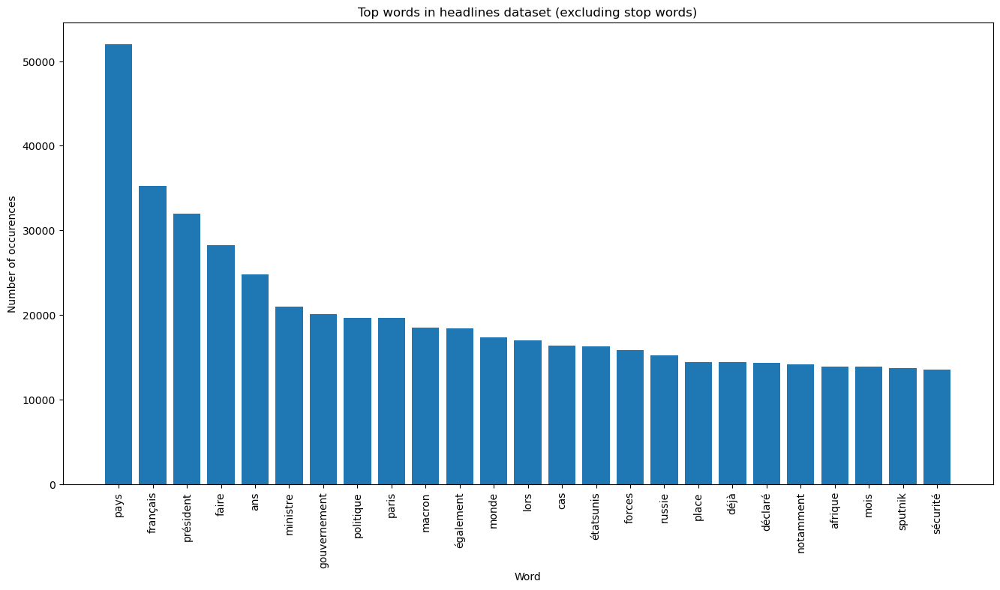

In [14]:
words, word_values = get_top_n_words(n_top_words=25,
                                     count_vectorizer=count_vectorizer, 
                                     text_data=reindexed_data)

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values);
ax.set_xticks(range(len(words)));
ax.set_xticklabels(words, rotation='vertical');
ax.set_title('Top words in headlines dataset (excluding stop words)');
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()

In [15]:
tagged_headlines = [TextBlob(reindexed_data[i]).pos_tags for i in range(reindexed_data.shape[0])]

KeyboardInterrupt: 

In [ ]:
tagged_headlines_df = pd.DataFrame({'tags':tagged_headlines})

word_counts = [] 
pos_counts = {}

for headline in tagged_headlines_df[u'tags']:
    word_counts.append(len(headline))
    for tag in headline:
        if tag[1] in pos_counts:
            pos_counts[tag[1]] += 1
        else:
            pos_counts[tag[1]] = 1
            
print('Total number of words: ', np.sum(word_counts))
print('Mean number of words per artcle: ', np.mean(word_counts))

Total number of words:  1294711
Mean number of words per artcle:  1341.6694300518134


In [20]:
print('Article before vectorization: {}'.format(reindexed_data[123]))

term_matrix = count_vectorizer.fit_transform(reindexed_data)

print('Headline after vectorization: \n{}'.format(term_matrix[123]))

Article before vectorization: lancée sur changeorg il y a un mois et adressée au directeur de la cour européenne des droits de l’homme une pétition appelant à envoyer emmanuel macron devant la cedh a recueilli à ce jour près de 26350 signatures l’objectif est d’en rassembler 35000 d’après les informations données sur cette plateforme son auteur qui se présente comme étant guido raimondi qualifie de scandale la gestion du maintien de l’ordre par le président de la république depuis le début de la mobilisation des gilets jaunes il fonde son jugement sur les images vidéos et témoignages faisant état d’un usage de la force complètement disproportionné tirs de flashball en plein tête utilisation abusive des grenades de désencerclement expéditions punitives au tonfa par des crs en large surnombre et ne donnant suite à aucune attestation etcetera les exemples ne manquent pas et sont complètement indignes dune démocratie moderne indiquetil dans le texte de la pétition ajoutant qu’il considère 

In [16]:
n_topics = 7

### 3.3) Latent Dirichilet Allocation

In [17]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

def get_top_n_words_LDA(n, keys, document_term_matrix, count_vectorizer):
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = np.zeros((1, document_term_matrix.shape[1]))
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i].toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:], 0)
        top_word_indices.append(top_n_word_indices)
    
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1, document_term_matrix.shape[1]))
            temp_word_vector[:, index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word)
        top_words.append(" ".join(topic_words))
    
    return top_words

def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [18]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [21]:
lda_model = LatentDirichletAllocation(n_components=n_topics, learning_method='batch', random_state=0, verbose=0)

lda_topic_matrix = lda_model.fit_transform(term_matrix)

In [22]:

from collections import Counter

your_list = get_keys(lda_topic_matrix)

element_counts = Counter(your_list)

for element, count in element_counts.items():
    print(f"{element}: {count} times")


1: 5486 times
6: 6656 times
5: 3689 times
0: 5050 times
4: 7235 times
2: 3436 times
3: 4933 times


In [23]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

Text(0, 0.5, 'Number of headlines')

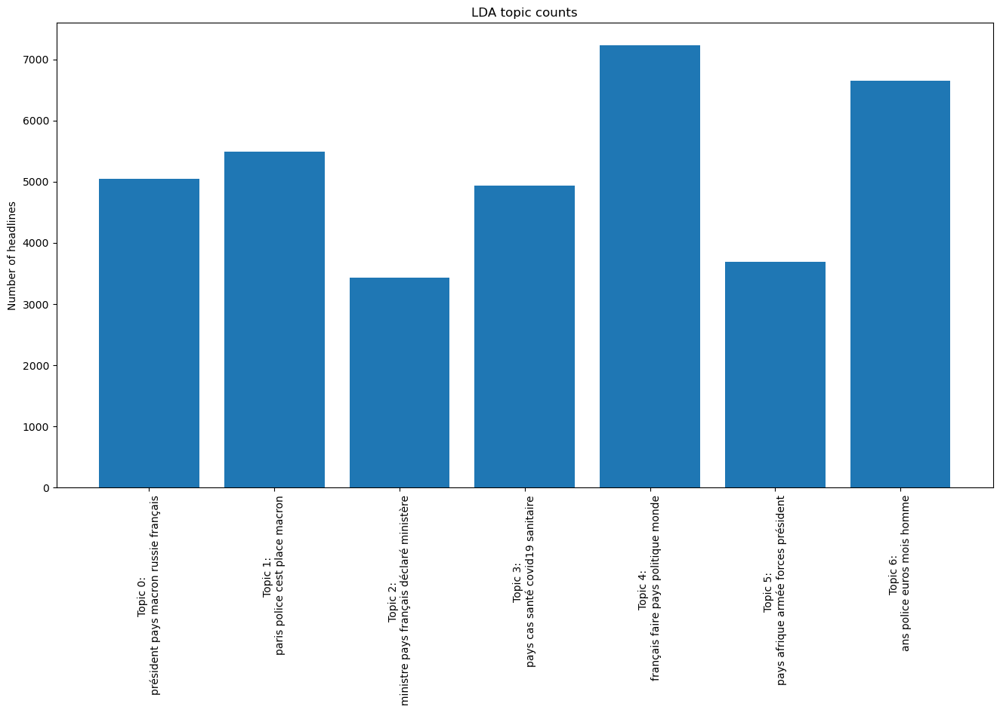

In [24]:
top_3_words = get_top_n_words_LDA(5, lda_keys, term_matrix, count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16, 8))
ax.bar(lda_categories, lda_counts)
ax.set_xticks(lda_categories)
ax.set_xticklabels(labels)
ax.set_xticklabels(labels, rotation=90)
ax.set_title('LDA topic counts')
ax.set_ylabel('Number of headlines')

In [25]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate='auto', 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 36485 samples in 0.103s...
[t-SNE] Computed neighbors for 36485 samples in 6.865s...
[t-SNE] Computed conditional probabilities for sample 1000 / 36485
[t-SNE] Computed conditional probabilities for sample 2000 / 36485
[t-SNE] Computed conditional probabilities for sample 3000 / 36485
[t-SNE] Computed conditional probabilities for sample 4000 / 36485
[t-SNE] Computed conditional probabilities for sample 5000 / 36485
[t-SNE] Computed conditional probabilities for sample 6000 / 36485
[t-SNE] Computed conditional probabilities for sample 7000 / 36485
[t-SNE] Computed conditional probabilities for sample 8000 / 36485
[t-SNE] Computed conditional probabilities for sample 9000 / 36485
[t-SNE] Computed conditional probabilities for sample 10000 / 36485
[t-SNE] Computed conditional probabilities for sample 11000 / 36485
[t-SNE] Computed conditional probabilities for sample 12000 / 36485
[t-SNE] Computed conditional probabilities for sa

In [26]:
top_3_words_lda = get_top_n_words_LDA(5, lda_keys, term_matrix, count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics))
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

## 4) EDA

In [27]:
df['cluster'] = lda_keys
df['vector1'] = tsne_lda_vectors[:, 0]
df['vector2'] = tsne_lda_vectors[:, 1]

In [28]:
top_3_words_lda = get_top_n_words_LDA(30, lda_keys, term_matrix, count_vectorizer)

dict_clucter_30_words = {i: top_3_words_lda[i] for i in range(len(top_3_words_lda))}
dict_clucter_30_words

{0: 'président pays macron russie français étatsunis emmanuel politique russe ministre déclaré faire guerre lors chef gouvernement sputnik française également militaire sécurité accord paris europe américain européenne atil affaires notamment république',
 1: 'paris police cest place macron ans lors français samedi sputnik forces faire président quil dun homme dune république ministre également mouvement ordre emmanuel vidéo 14 atil dit 15 mars juillet',
 2: 'ministre pays français déclaré ministère affaires annoncé source étrangères communiqué paris presse président étatsunis lors groupe sécurité indiqué accord également gouvernement dune atil défense décision octobre dun conseil septembre française',
 3: 'pays cas santé covid19 sanitaire mars nombre gouvernement français ministre mesures faire situation également crise déjà jours avril millions annoncé mois monde mai notamment juillet déclaré fin atil autorités population',
 4: 'français faire pays politique monde ans faut pouvoir pr

In [29]:
dict_clucter_title = {
    0: 'International Politics and Russo-French Relations',
    1: 'Parisian Public Order and Macron\'s Policies',
    2: 'French Foreign Affairs and Government Statements',
    3: 'French COVID-19 Response and Health Measures',
    4: 'French Political Landscape and Societal Issues',
    5: 'Military Involvement in Africa and Security Concerns',
    6: 'Criminal Investigations and Financial Crimes in France'
}

In [30]:
df['cluster_30_words'] = df['cluster'].map(dict_clucter_30_words)
df['cluster_title'] = df['cluster'].map(dict_clucter_title)

In [32]:
fig = px.scatter(df, x='vector1', y='vector2', color='cluster_title', hover_data=['title', 'description', 'domain'])
fig.update_layout(title='Scatter Plot with Cluster Colors and Keys')
fig.update_xaxes(title='Vector 1')
fig.update_yaxes(title='Vector 2')

#fig.write_html("./html_images_cluster/Scatter_cluster.html")

fig.show()

## 5) Save df

In [ ]:
df_final_draft = df[['date', 'url', 'domain', 'title', 'cluster', 'vector1', 'vector2', 'cluster_30_words', 'cluster_title']]
df_final_draft.head(5)

,date,url,domain,title,cluster,vector1,vector2,cluster_30_words,cluster_title
0,2019-01-02,https://french.presstv.ir/Detail/2019/01/03/58...,french.presstv.ir,Des terroristes de l'Armée syrienne libre envo...,2,-27.939808,8.679305,algérie pays militaire armée maroc israël algé...,Algeria-Morocco Conflict Dynamics
1,2019-01-03,https://french.presstv.ir/Detail/2019/01/04/58...,french.presstv.ir,Zoom Afrique du 4 janvier 2019,3,9.868510,-13.643680,pays mali armée président afrique forces barkh...,Mali Crisis and Government Response
2,2019-01-03,https://french.presstv.ir/Detail/2019/01/04/58...,french.presstv.ir,Les terroristes veulent déstabiliser l’Algérie,2,-27.256174,8.257619,algérie pays militaire armée maroc israël algé...,Algeria-Morocco Conflict Dynamics
3,2019-01-04,https://french.presstv.ir/Detail/2019/01/05/58...,french.presstv.ir,Zoom Afrique du 5 janvier 2019,0,2.600644,-11.895773,pays afrique côte président mali ivoire faire ...,International Relations and Security
4,2019-01-05,https://french.presstv.ir/Detail/2019/01/06/58...,french.presstv.ir,Zoom Afrique du 6 janvier 2019,1,-7.249902,-10.655392,pays afrique mali terroristes sahel président ...,Military Presence in Sahel Region


In [ ]:
df_final_draft['domain'].unique()

array(['french.presstv.ir'], dtype=object)

In [ ]:
# Save the DataFrame to a JSON file

# df_final_draft.to_json('./results/df_final_LDA-countVect.csv')

In [ ]:
# df_final_draft.to_csv('./df_final_LDA-CountVect.csv', index=False)
